# Chromatin at replication time: Early vs Late Replicating Origins

May 3, 2024

**Goal:** Identify differences in early and late firing origins. What patterns or signals in the chromatin can be discerned at replication time. Are early replicating genes distinct from late replicating?


In [3]:
# Preamble, notebook setup and imports

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [276]:
from src.global_config import GlobalConstants

repl_timing = pd.read_csv(GlobalConstants.REPL_TIMING_FILEPATH).set_index('orf_name')
print(len(repl_timing), " genes with replication profiles")
repl_timing.head()

5250  genes with replication profiles


,timing,H_index
orf_name,,
YAL067W-A,53.314585,196
YAL067C,52.304185,194
YAL064C-A,52.809385,195
YAL064W,51.798985,193
YAL063C-A,51.798985,193


In [5]:
from src.replication_deconvolution_solver import plot_chrom_repl_timing_from_data

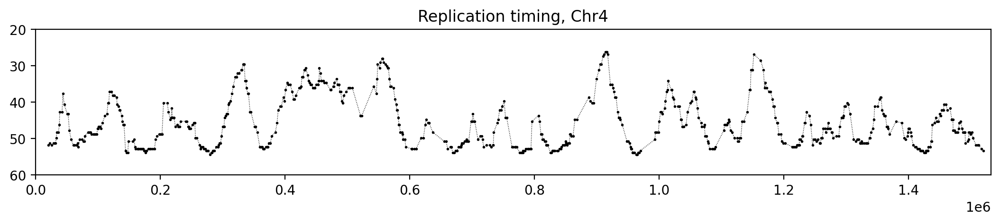

In [6]:
from src.geneset import get_deconvolved_geneset
geneset = get_deconvolved_geneset()

chrom = 4
plot_chrom_repl_timing_from_data(repl_timing, geneset, chrom)

In [7]:
from src.promoter_ptr_analysis import PromoterPTRAnalysis

chromatin_dir = 'output/deconvolve_combined_g_opt_2024_03_14/chromatin/'
promoter_analysis = PromoterPTRAnalysis(chromatin_dir)
promoter_analysis.load_f_files()

Shape of the loaded F: (227, 200)
1/5574 - 00:00:00.046
1001/5574 - 00:00:05.056
2001/5574 - 00:00:10.100
3001/5574 - 00:00:15.239
4001/5574 - 00:00:20.295
5001/5574 - 00:00:25.411


In [8]:
promoter_analysis.correct_f_images_by_strand()

In [9]:
# Let's get the gene expression at the replication time.

from src.gene_expression_deconv_analysis import GeneExpressionAnalysis

ge_analysis = GeneExpressionAnalysis(
    'output/deconvolve_combined_g_opt_2024_03_14/gene_expression/')
ge_analysis.load_gene_expression_fs()


# Which genes to start with?

Options:

Many genes, all genes compute the chromatin (some delta) before and after replication
- Prior-replication fork
- Post-replication fork

Early vs Late
High vs Low Gene expression


In [10]:
from src.gene_chromatin_replication_analysis import GeneChromatinReplicationAnalysis

gene_chrom_repl_analysis = GeneChromatinReplicationAnalysis(promoter_analysis,
                                                            ge_analysis,
                                                            repl_timing)

5232 genes with replication timing
Shape of the f images:  (5232, 227, 8, 25)


In [ ]:
gene_chrom_repl_analysis.geneset_repl.to_csv('datasets/computed_mnase/all_repl_timing_deconvolved_w_metadata_2024_05_09.csv')

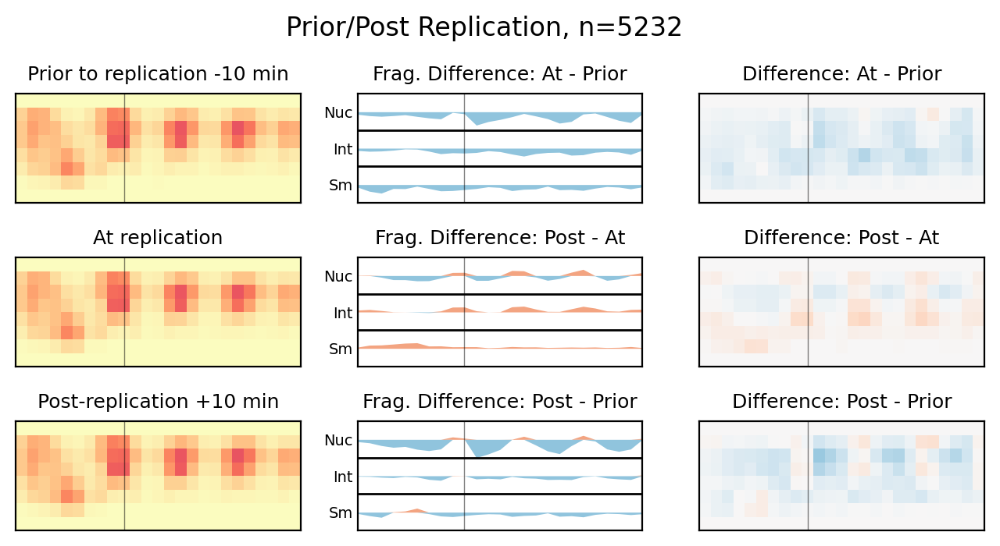

In [11]:
delta_ind = 20

gene_chrom_repl_analysis.select_subset(delta_index=delta_ind)
gene_chrom_repl_analysis.plot_pre_post_images()

In [12]:
repl_timing_values = gene_chrom_repl_analysis.geneset_repl.replication_timing
repl_timing_values = repl_timing_values.sort_values()

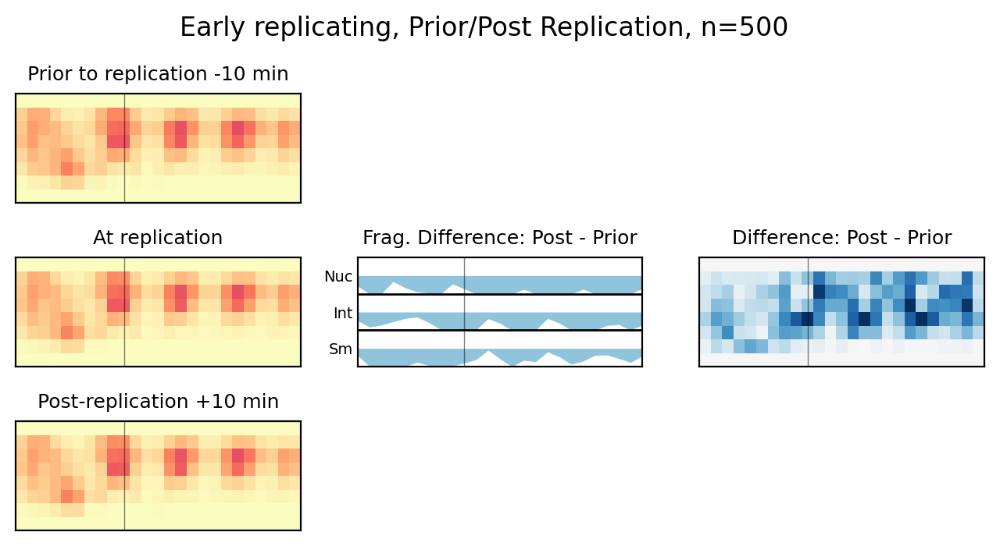

In [56]:
k = 500
gene_chrom_repl_analysis.select_subset(subset_orfs=repl_timing_values.head(k).index, 
                                       delta_index=delta_ind)
gene_chrom_repl_analysis.plot_pre_post_images(title="Early replicating")

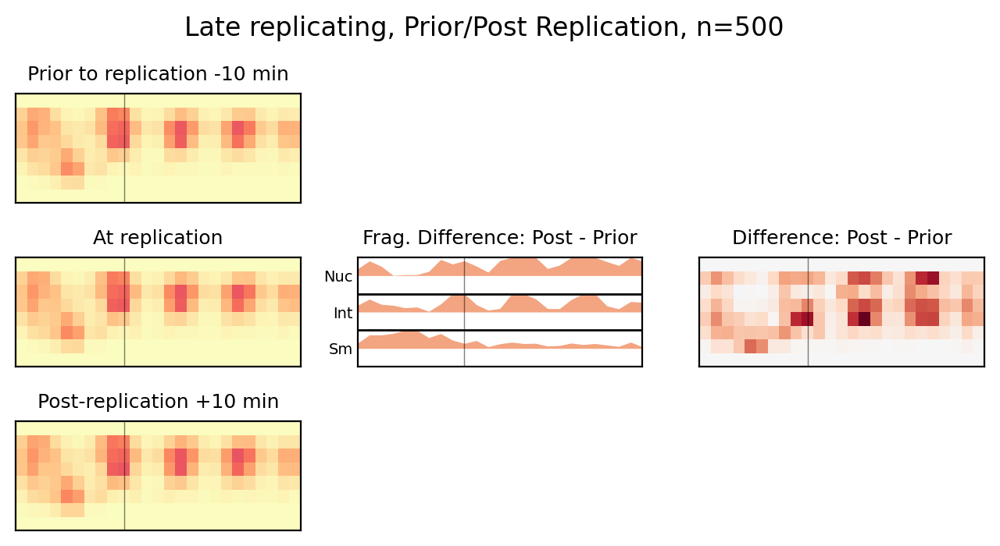

In [57]:
gene_chrom_repl_analysis.select_subset(subset_orfs=repl_timing_values.tail(k).index, 
                                       delta_index=delta_ind)
gene_chrom_repl_analysis.plot_pre_post_images(title="Late replicating")

In [16]:
from src.helpers import calc_entropy

In [361]:
gene_chrom_repl_analysis.compute_gene_nuc_entropy()

Shape of the f images:  (5232, 227, 8, 25)
Shape of the bins to compute entropy over:  (5232, 128, 17)


/Users/trung/opt/anaconda3/envs/cell-cycle-deconvolution/lib/python3.8/site-packages/scipy/stats/_entropy.py:135: RuntimeWarning: invalid value encountered in divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


In [284]:
gene_chrom_repl_analysis.normalized_entropy_df.to_csv('output/normalized_gb_entropy.csv')

In [ ]:
promoter_analysis.compute_small_fragments_promoter_occupancy()

In [286]:
promoter_analysis.sm_prom_occ_df.to_csv('output/small_fragments_occupancy.csv')

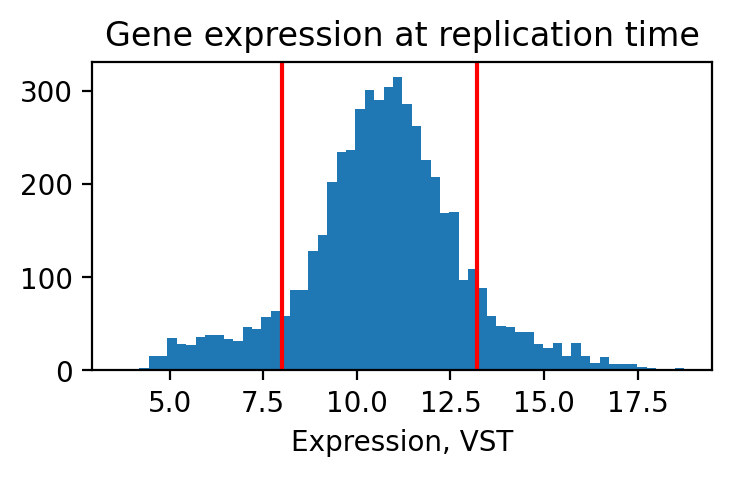

In [404]:
tx_repl = gene_chrom_repl_analysis.geneset_repl.expression_at_replication
plt.figure(figsize=(4, 2))
plt.hist(tx_repl, bins=60)
plt.title("Gene expression at replication time")
plt.xlabel("Expression, VST")

q25, q75 = np.quantile(tx_repl, q=[0.1, 0.9])

plt.axvline(q25, c='red')
plt.axvline(q75, c='red')

np.sum(tx_repl > q75), np.sum(tx_repl <  q25)

high_tx_orfs = tx_repl.loc[tx_repl > q75].index
low_tx_orfs = tx_repl.loc[tx_repl < q25].index

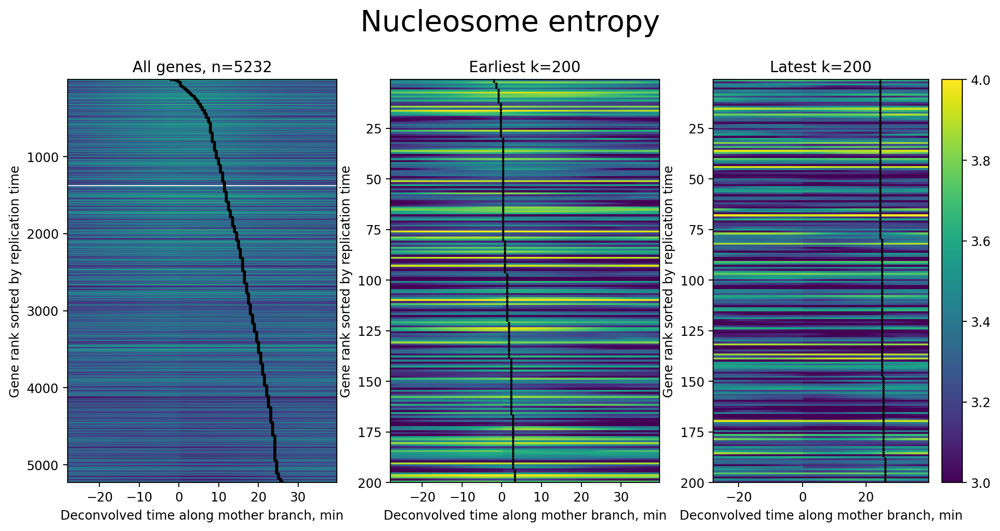

In [411]:
gene_chrom_repl_analysis.plot_early_late_entropy_hm_comparision(normalize=True)

# Plot the entropy values by quantiles to show distribution following the replication fork
# and the differences in overall entropy.

# Compare highly transcribed to lowly transcribed genes.

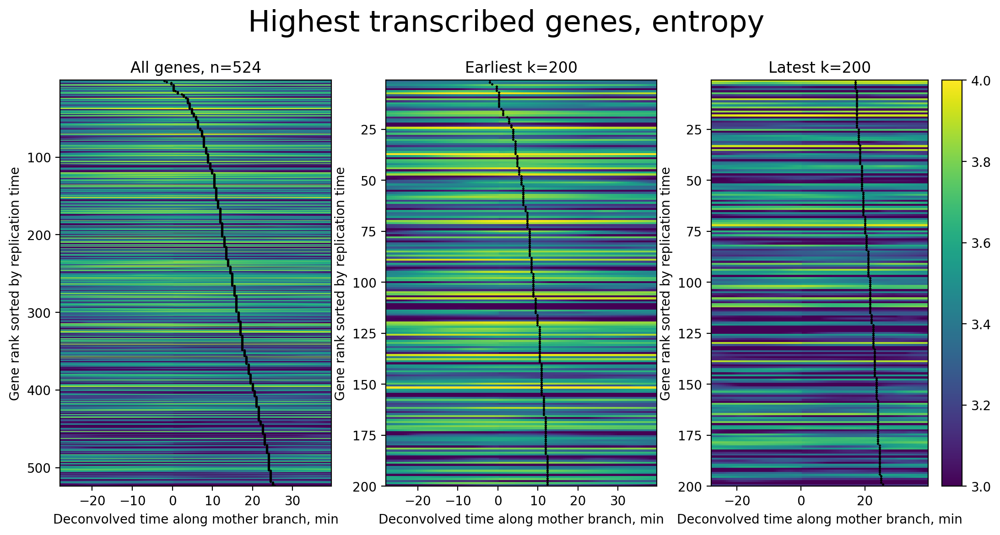

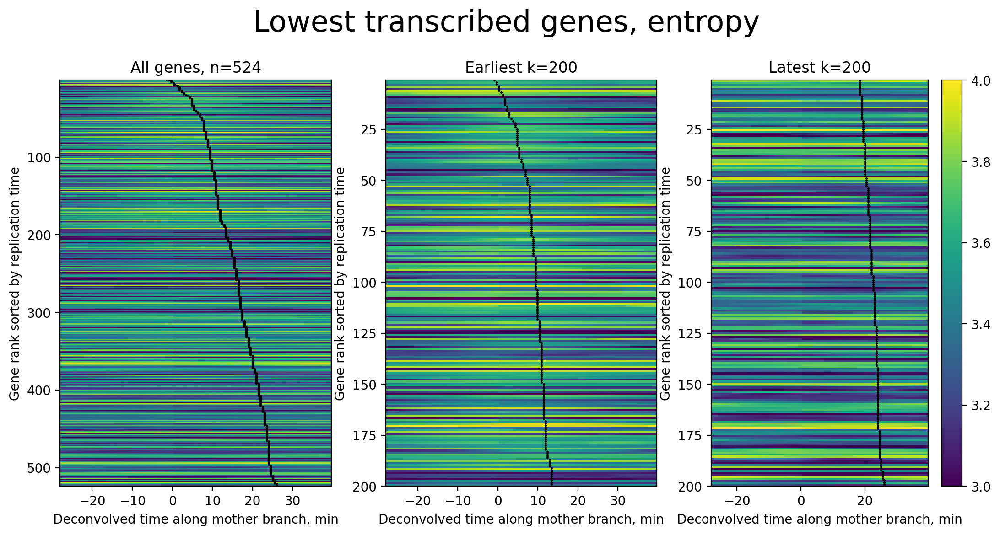

In [410]:
gene_chrom_repl_analysis.plot_early_late_entropy_hm_comparision(normalize=True,
    subset_orfs=high_tx_orfs, title="Highest transcribed genes, entropy")
gene_chrom_repl_analysis.plot_early_late_entropy_hm_comparision(normalize=True,
    subset_orfs=low_tx_orfs, title="Lowest transcribed genes, entropy")


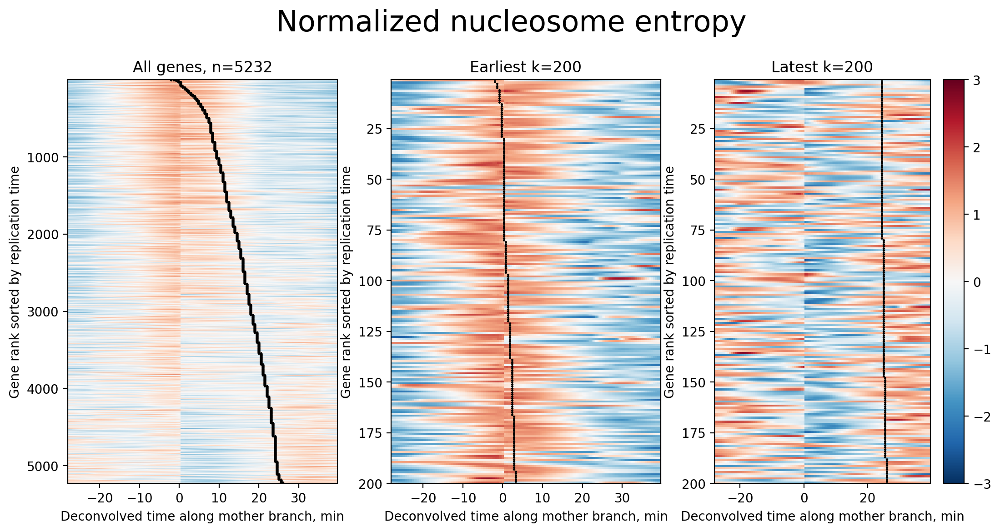

In [407]:
# In the unnormalized entropy scores, can we see a global effect of the replication fork
# passing through early and late genes?
gene_chrom_repl_analysis.plot_early_late_entropy_hm_comparision()


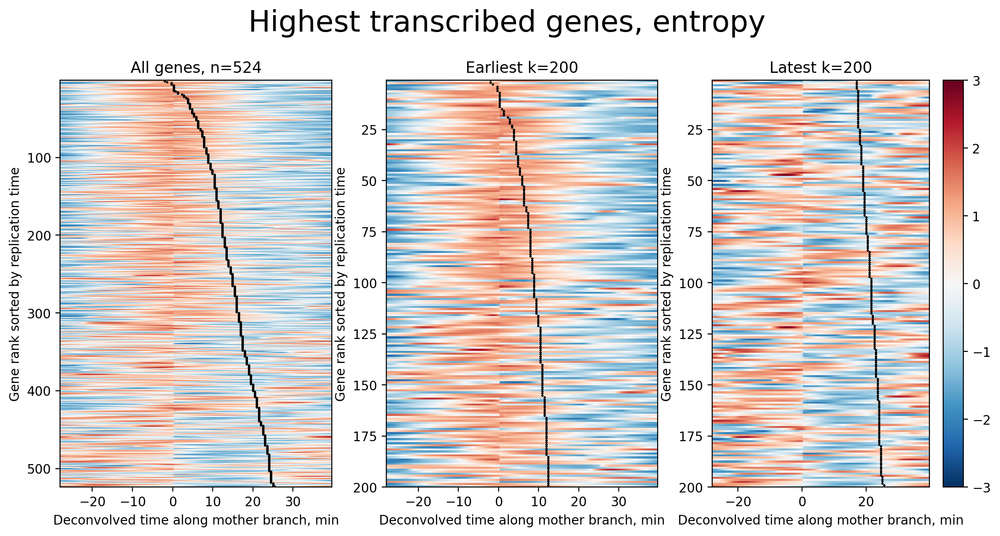

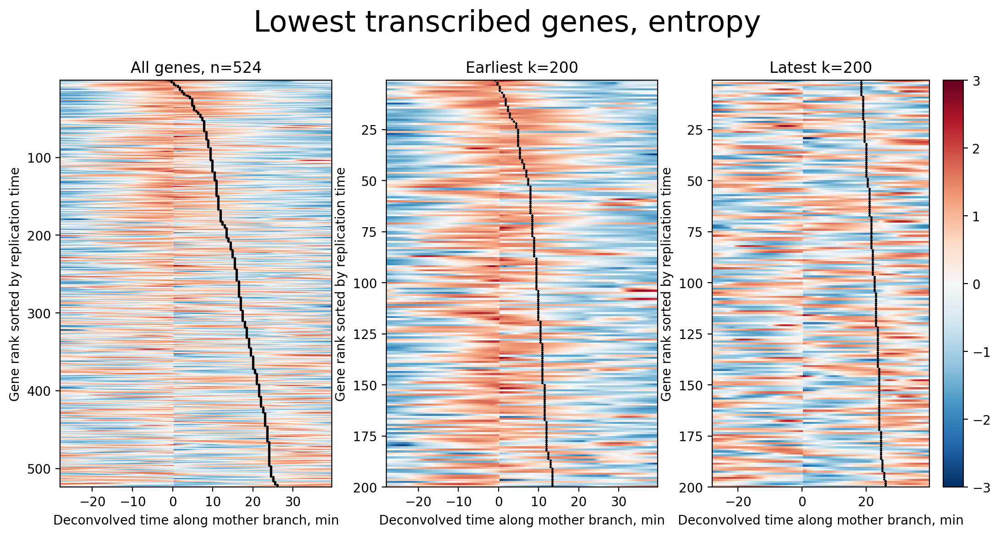

In [409]:
gene_chrom_repl_analysis.plot_early_late_entropy_hm_comparision(normalize=False,
    subset_orfs=high_tx_orfs, title="Highest transcribed genes, entropy")
gene_chrom_repl_analysis.plot_early_late_entropy_hm_comparision(normalize=False,
    subset_orfs=low_tx_orfs, title="Lowest transcribed genes, entropy")


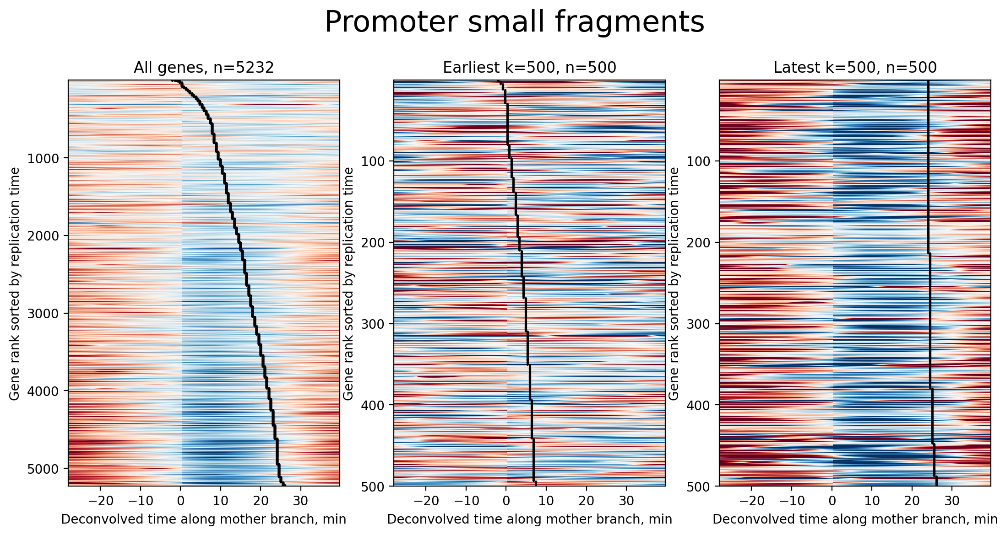

In [214]:
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis)

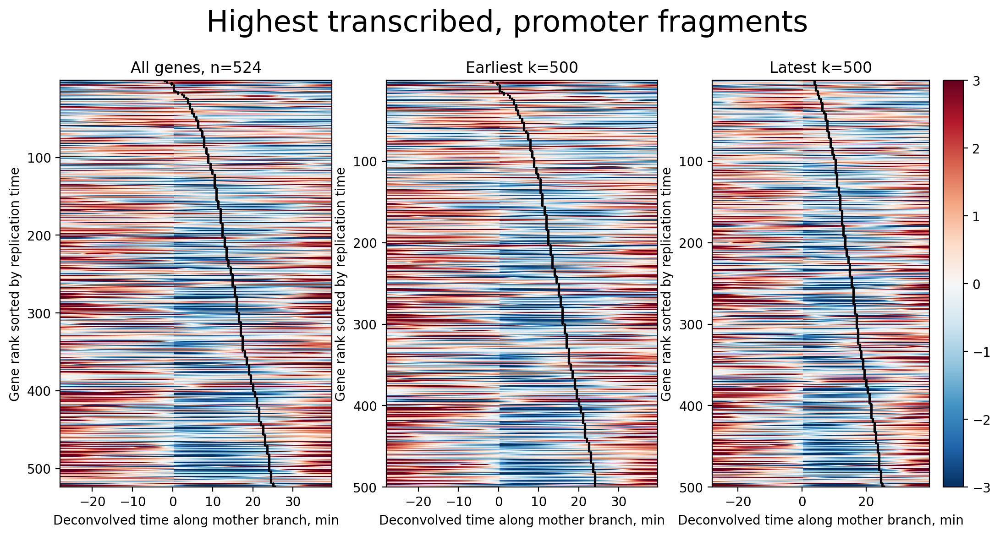

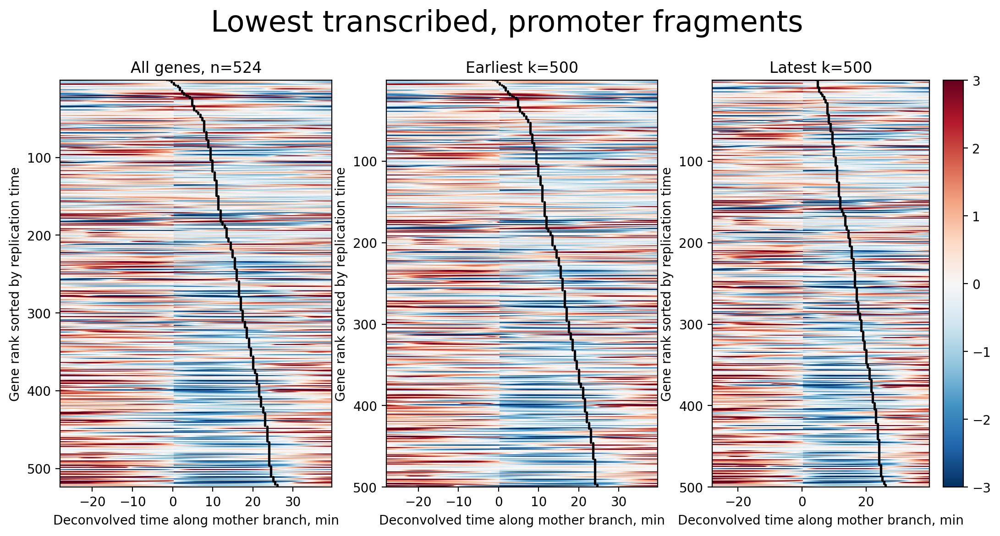

In [416]:
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis,
    subset_orfs=high_tx_orfs, title="Highest transcribed, promoter fragments")
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis,
    subset_orfs=low_tx_orfs, title="Lowest transcribed, promoter fragments")

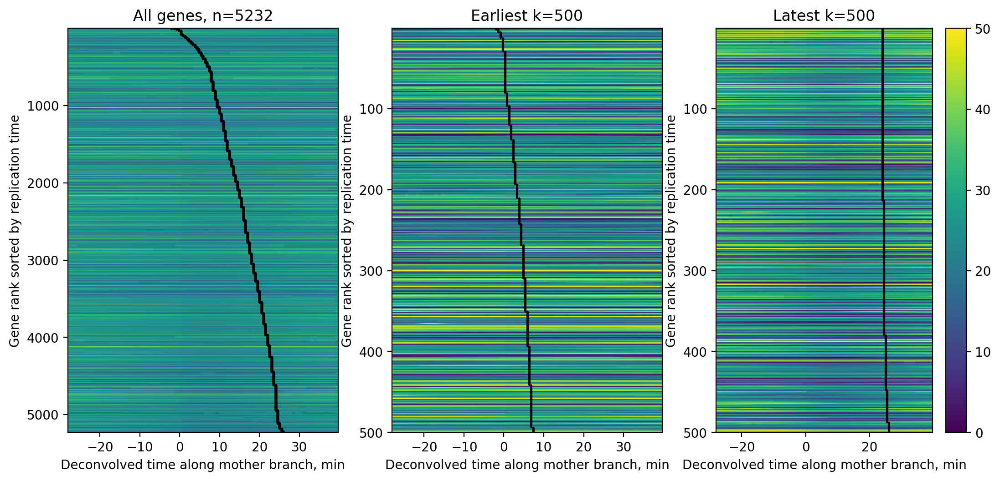

In [421]:
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis,
    normalize=False)

(524, 128)
(524, 128)
(524, 128)
(524, 128)


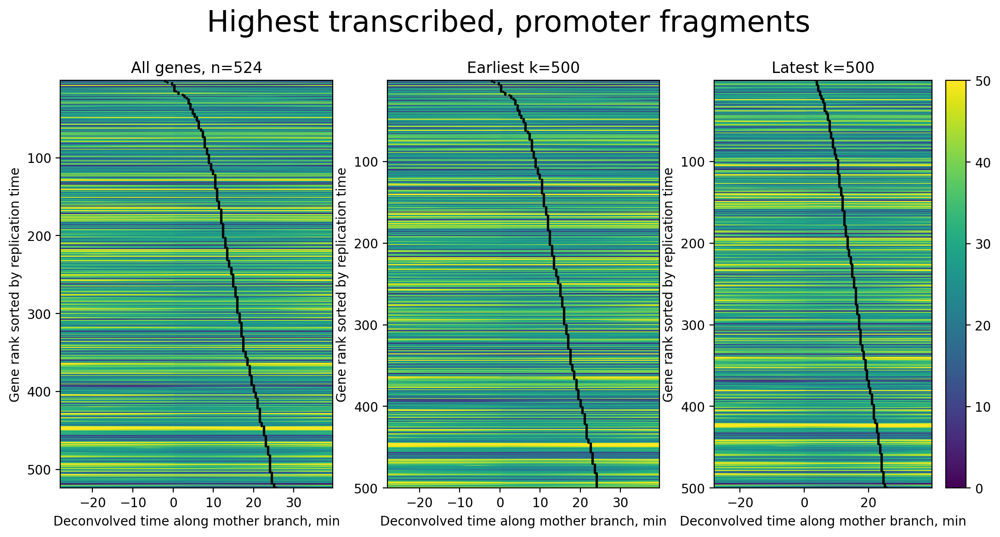

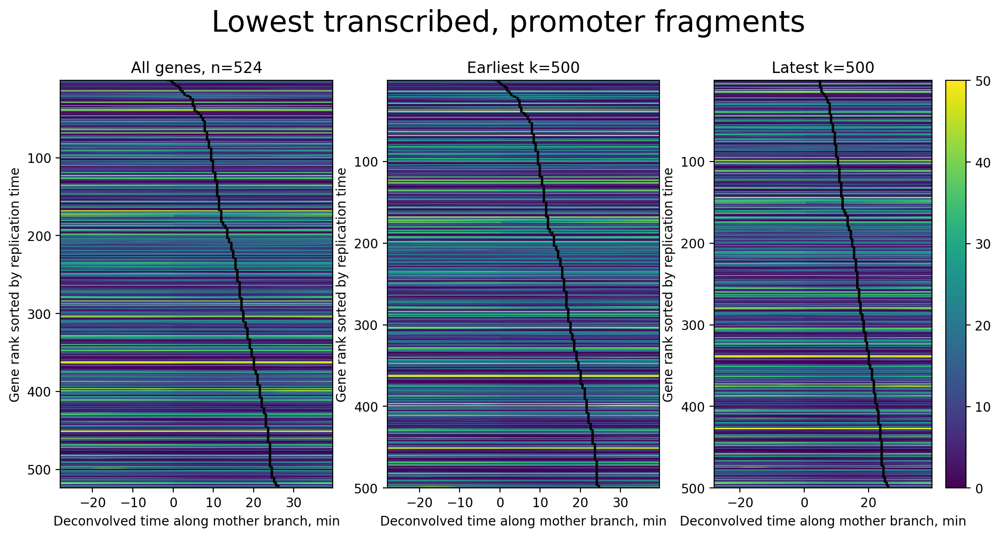

In [423]:
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis,
    subset_orfs=high_tx_orfs, title="Highest transcribed, promoter fragments",
                                                          normalize=False)
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis,
    subset_orfs=low_tx_orfs, title="Lowest transcribed, promoter fragments",
                                                          normalize=False)

Text(0.5, 1.0, 'Genes turned off during replication, have overall fewer small fragments')

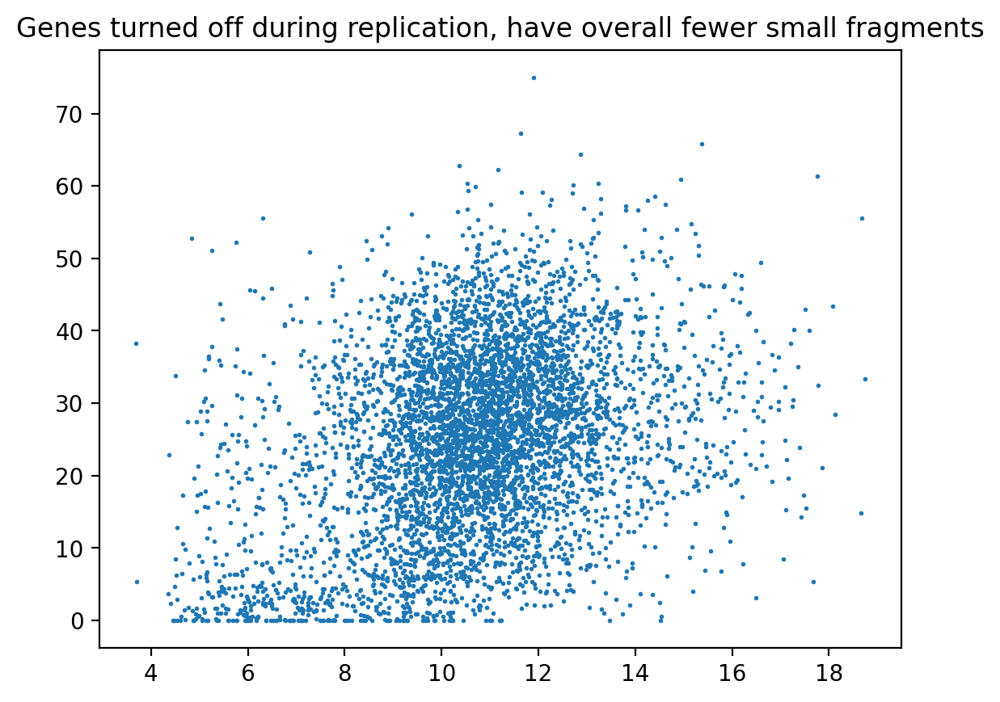

In [449]:
sm_t_mean = promoter_analysis.sm_prom_occ_df[t_indices].copy()
sm_t_mean['t_mean'] = sm_t_mean.mean(axis=1)
prom_vs_exp_repl = sm_t_mean[['t_mean']].join(
    gene_chrom_repl_analysis.geneset_repl[['expression_at_replication']],
    how='inner')

plt.scatter(prom_vs_exp_repl.expression_at_replication, prom_vs_exp_repl.t_mean, s=1)
plt.title("Genes turned off during replication, have overall fewer small fragments")

In [ ]:
gene_chrom_repl_analysis.plot_early_late_sm_hm_comparision(promoter_analysis, sub)

In [215]:
from src.gene_expression_deconv_analysis import GeneExpressionAnalysis

ge_analysis = GeneExpressionAnalysis(
    'output/deconvolve_combined_g_opt_2024_03_14/gene_expression/')
ge_analysis.load_gene_expression_fs()

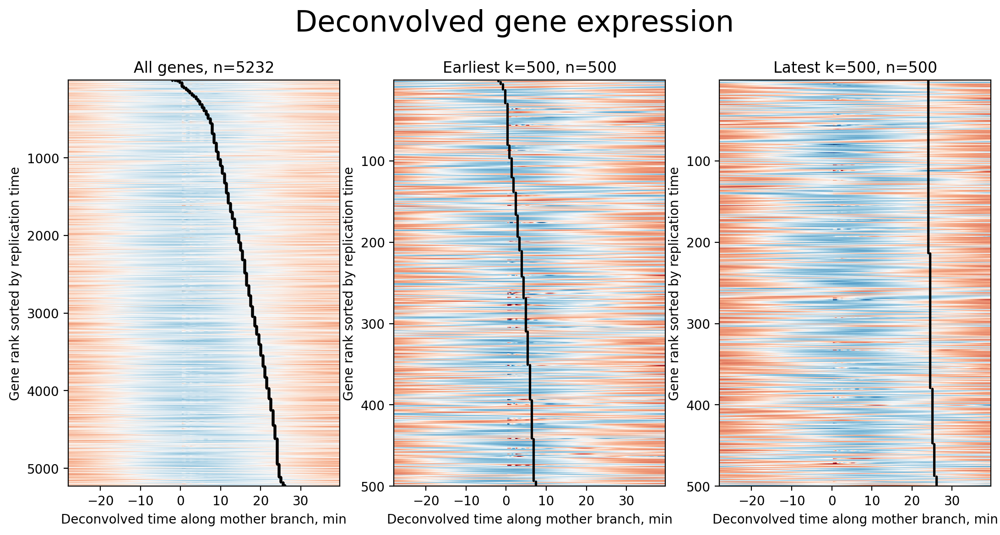

In [216]:
gene_chrom_repl_analysis.plot_early_late_gene_expression_comparison(ge_analysis)

4493


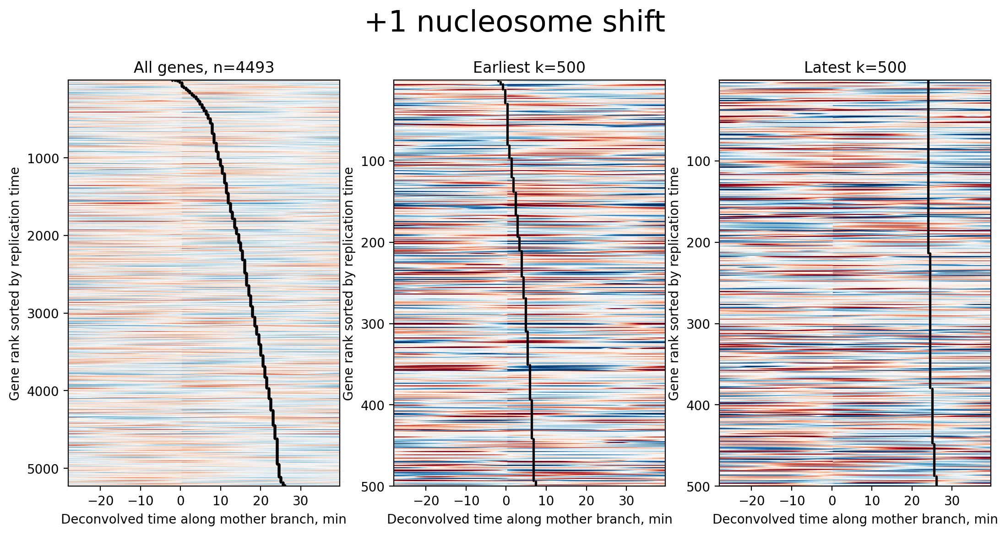

In [239]:
gene_chrom_repl_analysis.plot_early_late_plus_one_comparison()

In [349]:
# How do we efficiently subset the heatmaps above for different criteria?
# We would like to explore, high expression, early/late, etc..., gene direction, etc....
#
# We will need some kind of filtering framework
#
#
# Can we the chromatin metrics by time?
# Then identify the ranks in a replication window to see which genes have the most change
# in the replication window?
#
# And compare low and higly transcribed genes?

from src.geneset import get_deconvolved_geneset
geneset = get_deconvolved_geneset()
geneset['gene_index'] = np.arange(len(geneset))

plus_one = pd.read_csv(GlobalConstants.PLUS_ONE_FILEPATH).set_index('orf_name')
entropy = pd.read_csv(GlobalConstants.GB_ENTROPY).set_index('orf_name')
small_frag = pd.read_csv(GlobalConstants.SMALL_FRAG_OCC_FILEPATH).set_index('orf_name')
small_frag = small_frag[t_indices.astype(str)]
small_frag.columns = np.arange(len(small_frag.columns))

replication_timing = pd.read_csv(GlobalConstants.REPL_TIMING_FILEPATH).set_index('orf_name')

from src.helpers import common_index
orfs_in_common = common_index([geneset, replication_timing, 
    plus_one, entropy, small_frag], 0)


In [360]:
replication_timing # Convert the H index into t index

# Then get the delta 10 and 5 minutes forward and aft

# Create a function that computes the forward and after H_index by minute
# Handling wrap-around and indexing into G1, which has a different time step
from src.config import load_yl_rg1_vst_config

config = load_yl_rg1_vst_config(1)
def compute_t_index_delta(center_index, delta_min, config):
        
    cg1_indices = config.get_Hpositions_for_phase('CG1')
    postg1_indices = config.get_Hpositions_for_phase('postG1')
    t_indices = config.get_Hpositions_for_branch('t')

    cg1_tps = config.get_phase_timepoints_for_phase('CG1')
    postg1_tps = config.get_phase_timepoints_for_phase('postG1')
    
    g1_step_min = cg1_tps[1]-cg1_tps[0]
    postg1_step_min = postg1_tps[1]-postg1_tps[0]
    
    before_index = center_index-delta
    after_index = center_index+delta
    
    # Check wrap-around for after_index:
    if after_index > len(t_indices):
        # Wrap around, then compute how many indices into g1?
        pass
    
    pass

# For each metric and rank...
